## **BG Subtraction**

- Separate the building rooftops from the entire background and remove the building so that it can be used in the next step to annotate using the CVAT tool.

In [ ]:
!pip install keras-unet

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from keras_unet.utils import get_patches
import glob
import os

%matplotlib inline

-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_path_image = '/content/drive/MyDrive/airs-minisample/train/image/christchurch_10.tif'
train_path_label = '/content/drive/MyDrive/airs-minisample/train/label/christchurch_10_vis.tif'

- cv2.imread will convert image to numpy array

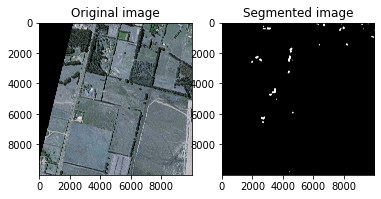

In [ ]:
img = cv2.imread(train_path_image, cv2.IMREAD_COLOR)
img_mask = cv2.imread(train_path_label, cv2.IMREAD_COLOR)

plt.subplot(1,2,1)
plt.imshow(img)
plt.title('Original image')

plt.subplot(1,2,2)
plt.imshow(img_mask)
plt.title('Segmented image')

plt.show()

In [ ]:
train_X = np.array(img_mask)
train_y = np.array(img)
print(type(train_X), train_y.shape)
print(img_mask.shape, img.shape)

<class 'numpy.ndarray'> (10000, 10000, 3)
(10000, 10000, 3) (10000, 10000, 3)


In [ ]:
# Post-process
new_seg_image_gray = cv2.cvtColor(img_mask, cv2.COLOR_RGB2GRAY) # Convert the mask to grayscale
img_np = np.asarray(img) # Convert the PIL image to a numpy array
masked_out = cv2.bitwise_and(img_np, img_np, mask=new_seg_image_gray) # Blend the mask
masked_out_new = np.where(masked_out != 0, masked_out, 255) # Remove the background

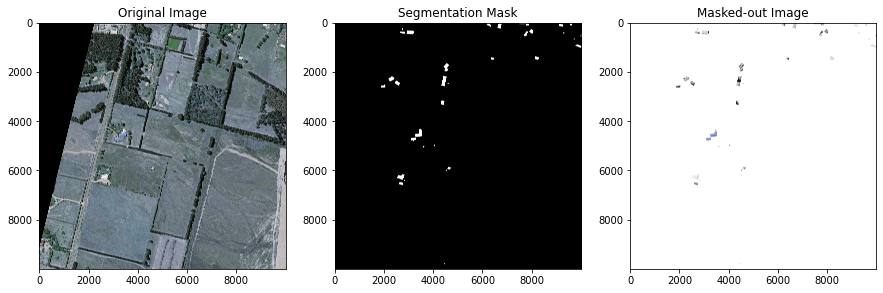

In [ ]:
# Visualize
plt.figure(figsize=(15,15))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(img_mask)
plt.title('Segmentation Mask')

plt.subplot(1, 3, 3)
plt.imshow(masked_out_new)
plt.title('Masked-out Image')

plt.show()

**IDEA**

- Draw bounding boxes in segmented image. ✅
- Store the bounded boxes result in a vector. ✅
- Fill the bounding box with a color (Color filling - so that the entire bounding box is filled with white color): named as seg_with_bounded_box. ✅
- Perform background subtraction: original aerial imagery - seg_with_bounded_box. ✅
- Crop regions based on the bounded box stored in step 2. ✅


-- For now try this: In case, resolution is not so good we can try zooming first and then cropping

### **Draw bounding boxes on the binary segmented mask & perform color filling**

- Convert the image to grayscale.
- Apply threshold.
- Get contours.
- Fill bounding box with color
- Store {x,y,w,h} in a vector of list

In [ ]:
# read image
img_mask = cv2.imread(train_path_label)
print(type(img))
# convert to grayscale
gray = cv2.cvtColor(img_mask,cv2.COLOR_BGR2GRAY)

# threshold
thresh = cv2.threshold(gray,128,255,cv2.THRESH_BINARY)[1]

# get contours
result = img_mask.copy()
seg_with_bounded_box = img_mask.copy()
contours = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = contours[0] if len(contours) == 2 else contours[1]
print("No of identified buildings: {0}".format(len(contours)))
bb = []

for cntr in contours:
    x,y,w,h = cv2.boundingRect(cntr)
    cv2.rectangle(result, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.rectangle(seg_with_bounded_box, (x, y), (x+w, y+h), (255, 255, 255), -1)
    # print("x,y,w,h:",x,y,w,h)
    bb.append([x,y,w,h])

    """ 
    To crop the image: 

    cropped_image = result[y:y+h, x:x+w]
    print([x,y,w,h])
    plt.imshow(cropped_image)
    cv2.imwrite('/content/drive/MyDrive/airs-minisample/crop.tif',cropped_image)
    break
    """

# save resulting image
cv2.imwrite('/content/drive/MyDrive/airs-minisample/bounded-box.tif', result) 
cv2.imwrite('/content/drive/MyDrive/airs-minisample/color_filled.tif', seg_with_bounded_box)  
print(bb)   

# show thresh and result    
# cv2.imshow("bounding_box", result)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

<class 'numpy.ndarray'>
No of identified buildings: 36
[[4398, 9761, 57, 48], [2593, 6474, 179, 134], [2794, 6393, 39, 47], [2518, 6162, 300, 227], [4495, 5982, 48, 49], [4548, 5860, 140, 123], [3544, 5015, 81, 73], [4019, 4946, 46, 85], [3072, 4680, 203, 148], [3245, 4328, 293, 331], [4277, 3173, 159, 189], [1877, 2534, 166, 122], [4552, 2466, 77, 43], [2409, 2373, 232, 209], [2157, 2195, 256, 221], [4302, 2184, 220, 421], [4389, 1661, 235, 357], [6308, 1429, 127, 111], [8082, 1390, 178, 153], [9731, 906, 269, 143], [9654, 661, 54, 58], [2889, 453, 31, 16], [9231, 418, 67, 63], [9934, 403, 66, 191], [2647, 387, 200, 91], [7631, 362, 195, 228], [2923, 345, 275, 152], [7859, 285, 179, 195], [2700, 250, 40, 79], [9070, 74, 159, 114], [6574, 42, 176, 227], [7748, 36, 92, 110], [9505, 2, 99, 142], [2620, 2, 157, 36], [7467, 0, 256, 94], [6133, 0, 188, 200]]


In [ ]:
def plot_image(path):
  image = cv2.imread(path, cv2.IMREAD_COLOR)
  imageplot = plt.imshow(image)
  plt.show()

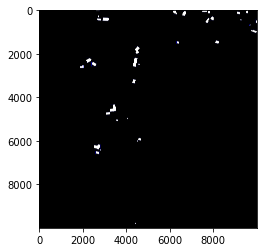

In [ ]:
plot_image('/content/drive/MyDrive/airs-minisample/bounded-box.tif')

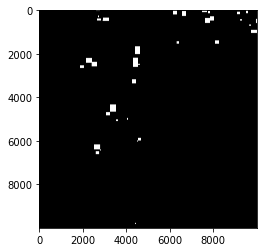

In [ ]:
plot_image('/content/drive/MyDrive/airs-minisample/color_filled.tif')

### **Background Subtraction**


In [ ]:
# Post-process
new_seg_image_gray = cv2.cvtColor(seg_with_bounded_box, cv2.COLOR_RGB2GRAY) # Convert the mask to grayscale
img_np = np.asarray(img) # Convert the PIL image to a numpy array
masked_out = cv2.bitwise_and(img_np, img_np, mask=new_seg_image_gray) # Blend the mask
masked_out_new = np.where(masked_out != 0, masked_out, 255) # Remove the background

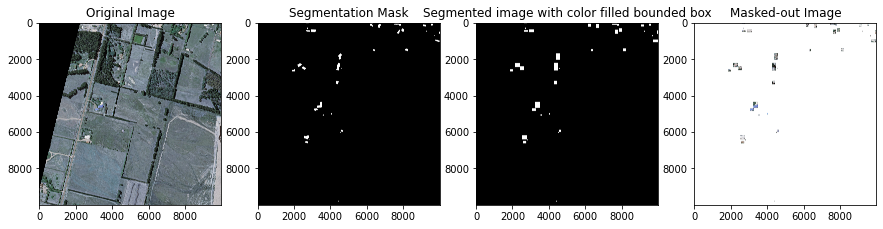

In [ ]:
# Visualize
plt.figure(figsize=(15,15))

plt.subplot(1, 4, 1)
plt.imshow(img)
plt.title('Original Image')

plt.subplot(1, 4, 2)
plt.imshow(img_mask)
plt.title('Segmentation Mask')

plt.subplot(1, 4, 3)
plt.imshow(seg_with_bounded_box)
plt.title('Segmented image with color filled bounded box')

plt.subplot(1, 4, 4)
plt.imshow(masked_out_new)
plt.title('Masked-out Image')

plt.show()

### **Cropping & Saving Buidings**

In [ ]:
for i in range(len(bb)):
  x = bb[i][0]
  y = bb[i][1]
  w = bb[i][2]
  h = bb[i][3]
  print('x, y, w, h: ', x,y,w,h)
  # try using Image.crop()
  masked_out_new.crop((x,y,w,h))
  cv2.imwrite('/content/drive/MyDrive/airs-minisample/crop-saved/'+str(i)+'.tif', masked_out_new.crop((x,y,w,h)))
  # cv2.imwrite('/content/drive/MyDrive/airs-minisample/crop-saved/'+str(i)+'.tif', masked_out_new[y:y+h, x:x+w])


x, y, w, h:  4398 9761 57 48
x, y, w, h:  2593 6474 179 134
x, y, w, h:  2794 6393 39 47
x, y, w, h:  2518 6162 300 227
x, y, w, h:  4495 5982 48 49
x, y, w, h:  4548 5860 140 123
x, y, w, h:  3544 5015 81 73
x, y, w, h:  4019 4946 46 85
x, y, w, h:  3072 4680 203 148
x, y, w, h:  3245 4328 293 331
x, y, w, h:  4277 3173 159 189
x, y, w, h:  1877 2534 166 122
x, y, w, h:  4552 2466 77 43
x, y, w, h:  2409 2373 232 209
x, y, w, h:  2157 2195 256 221
x, y, w, h:  4302 2184 220 421
x, y, w, h:  4389 1661 235 357
x, y, w, h:  6308 1429 127 111
x, y, w, h:  8082 1390 178 153
x, y, w, h:  9731 906 269 143
x, y, w, h:  9654 661 54 58
x, y, w, h:  2889 453 31 16
x, y, w, h:  9231 418 67 63
x, y, w, h:  9934 403 66 191
x, y, w, h:  2647 387 200 91
x, y, w, h:  7631 362 195 228
x, y, w, h:  2923 345 275 152
x, y, w, h:  7859 285 179 195
x, y, w, h:  2700 250 40 79
x, y, w, h:  9070 74 159 114
x, y, w, h:  6574 42 176 227
x, y, w, h:  7748 36 92 110
x, y, w, h:  9505 2 99 142
x, y, w, h:  2620 2 

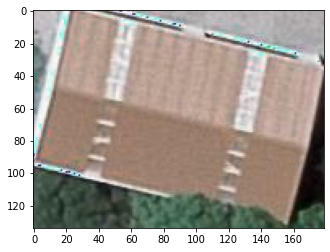

In [ ]:
# 2593 6474 179 134
plt.imshow(img[6474:6474+134, 2593:2593+179, :])

In [ ]:
from PIL import Image    
n = Image.open(train_path_image)
print(n)
cv2.imwrite('/content/drive/MyDrive/airs-minisample/cropping-using-crop.tif', np.array(n.crop((2593,6474,2593+179,6474+134))))

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


<PIL.TiffImagePlugin.TiffImageFile image mode=RGB size=10000x10000 at 0x7F77C8438190>


True

True

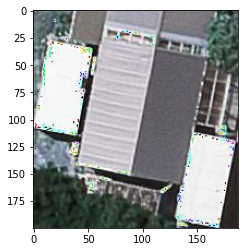

In [ ]:
# 6133 0 188 200
plt.imshow(img[0:200, 6133:6133+188, :])
cv2.imwrite('/content/drive/MyDrive/airs-minisample/asp.tif',img[0:200, 6133:6133+188, :])

### **Zoom and then crop & save image**

**Zooming without loosing aspect ratio:** https://stackoverflow.com/questions/69050464/zoom-into-image-with-cv2

In [ ]:
def zoom_at(img, x, y, zoom):
    w, h = img.size
    zoom2 = zoom * 50
    img = img.crop((x - w / zoom2, y - h / zoom2, 
                    x + w / zoom2, y + h / zoom2))
    return img.resize((w, h), Image.LANCZOS)

In [ ]:
img_zoom = Image.open("/content/drive/MyDrive/airs-minisample/train/image/christchurch_10.tif")
for i in range(len(bb)):
  x = bb[i][0]
  y = bb[i][1]
  w = bb[i][2]
  h = bb[i][3]
  print('x, y, w, h: ', x,y,w,h)

  image_bb_zoomed = zoom_at(img_zoom, x+w//2, y+h//2, 1.5)
  image_bb_zoomed.save('/content/drive/MyDrive/airs-minisample/crop-saved/zoom-'+str(i)+'.tif')
  # cv2.imwrite('/content/drive/MyDrive/airs-minisample/crop-saved/zoom-'+str(i)+'.tif', image_bb_zoomed)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


x, y, w, h:  4398 9761 57 48
x, y, w, h:  2593 6474 179 134
x, y, w, h:  2794 6393 39 47
x, y, w, h:  2518 6162 300 227
x, y, w, h:  4495 5982 48 49
x, y, w, h:  4548 5860 140 123
x, y, w, h:  3544 5015 81 73
x, y, w, h:  4019 4946 46 85
x, y, w, h:  3072 4680 203 148
x, y, w, h:  3245 4328 293 331
x, y, w, h:  4277 3173 159 189
x, y, w, h:  1877 2534 166 122
x, y, w, h:  4552 2466 77 43
x, y, w, h:  2409 2373 232 209
x, y, w, h:  2157 2195 256 221
x, y, w, h:  4302 2184 220 421
x, y, w, h:  4389 1661 235 357
x, y, w, h:  6308 1429 127 111
x, y, w, h:  8082 1390 178 153
x, y, w, h:  9731 906 269 143
x, y, w, h:  9654 661 54 58
x, y, w, h:  2889 453 31 16
x, y, w, h:  9231 418 67 63
x, y, w, h:  9934 403 66 191
x, y, w, h:  2647 387 200 91
x, y, w, h:  7631 362 195 228
x, y, w, h:  2923 345 275 152
x, y, w, h:  7859 285 179 195
x, y, w, h:  2700 250 40 79
x, y, w, h:  9070 74 159 114
x, y, w, h:  6574 42 176 227
x, y, w, h:  7748 36 92 110
x, y, w, h:  9505 2 99 142
x, y, w, h:  2620 2 

### **Cut small patches from big satellite images**

In [ ]:
train_path_image = '/content/drive/MyDrive/airs-minisample/train/image/christchurch_97.tif'

In [ ]:
x = np.array(Image.open(train_path_image))
print("x shape: ", str(x.shape))

x_crops = get_patches(
    img_arr=x, # required - array of images to be cropped
    size=1536, # default is 256
    stride=1536) # default is 256

print("x_crops shape: ", str(x_crops.shape))


-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------


/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (100000000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


x shape:  (10000, 10000, 3)
x_crops shape:  (36, 1536, 1536, 3)


In [ ]:
def plot_patches(img_arr, org_img_size, name, stride=None, size=None):
    """
    Plots all the patches for the first image in 'img_arr' trying to reconstruct the original image
    Args:
        img_arr (numpy.ndarray): [description]
        org_img_size (tuple): [description]
        stride ([type], optional): [description]. Defaults to None.
        size ([type], optional): [description]. Defaults to None.
    Raises:
        ValueError: [description]
    """

    # check parameters
    if type(org_img_size) is not tuple:
        raise ValueError("org_image_size must be a tuple")

    if img_arr.ndim == 3:
        img_arr = np.expand_dims(img_arr, axis=0)

    if size is None:
        size = img_arr.shape[1]

    if stride is None:
        stride = size

    i_max = (org_img_size[0] // stride) + 1 - (size // stride)
    j_max = (org_img_size[1] // stride) + 1 - (size // stride)

    fig, axes = plt.subplots(i_max, j_max, figsize=(i_max * 2, j_max * 2))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)
    jj = 0
    for i in range(i_max):
        for j in range(j_max):
            axes[i, j].imshow(img_arr[jj])
            axes[i, j].set_axis_off()
            # print(type(img_arr[jj]), img_arr[jj].shape)
            cv2.imwrite(name+str(jj)+'.tif', img_arr[jj])
            jj += 1

x_crops shape:  (36, 1536, 1536, 3)


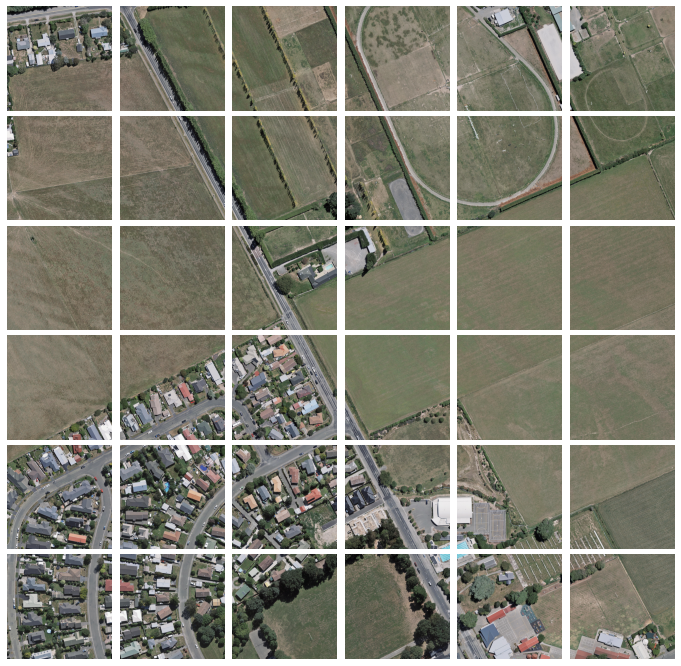

In [ ]:
# from keras_unet.utils import plot_patches
   
print("x_crops shape: ", str(x_crops.shape))         
plot_patches(
    img_arr=x_crops, # required - array of cropped out images
    org_img_size=(10000, 10000), # required - original size of the image
    name = '/content/drive/MyDrive/airs-minisample/patch/christchurch_97-', 
    stride=1536 # use only if stride is different from patch size
    ) 

In [ ]:
train_image_list = ['christchurch_1043.tif', 'christchurch_995.tif', 'christchurch_36.tif', 'christchurch_411.tif', 'christchurch_458.tif', 'christchurch_490.tif', 'christchurch_174.tif']
train_label_list = ['christchurch_1043_vis.tif', 'christchurch_995_vis.tif', 'christchurch_36_vis.tif', 'christchurch_411_vis.tif', 'christchurch_458_vis.tif', 'christchurch_490_vis.tif', 'christchurch_174_vis.tif']

In [ ]:
val_image_list = ['christchurch_445.tif']
val_label_list = ['christchurch_445_vis.tif']

For christchurch_1043.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_995.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_36.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_411.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_458.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_490.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_174.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)


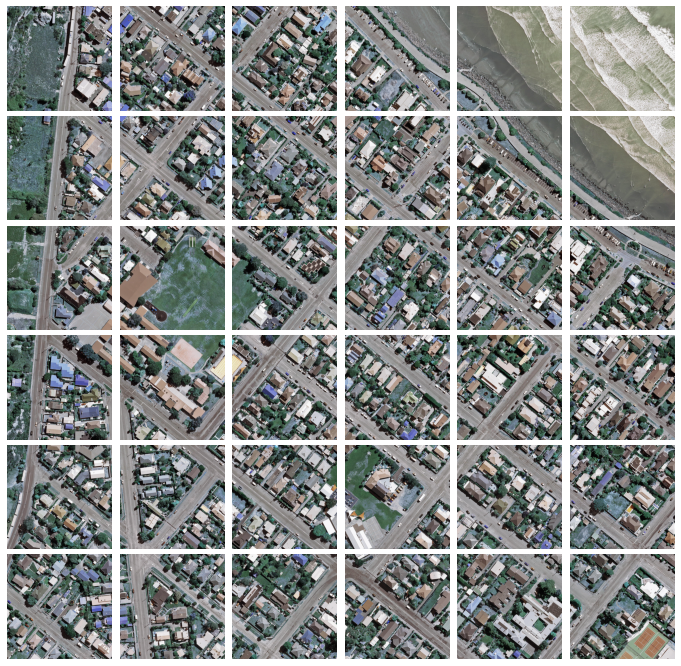

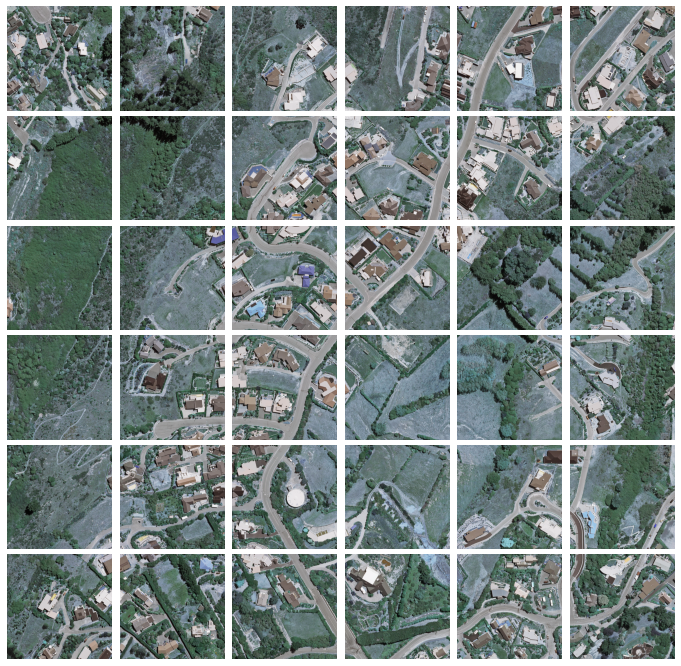

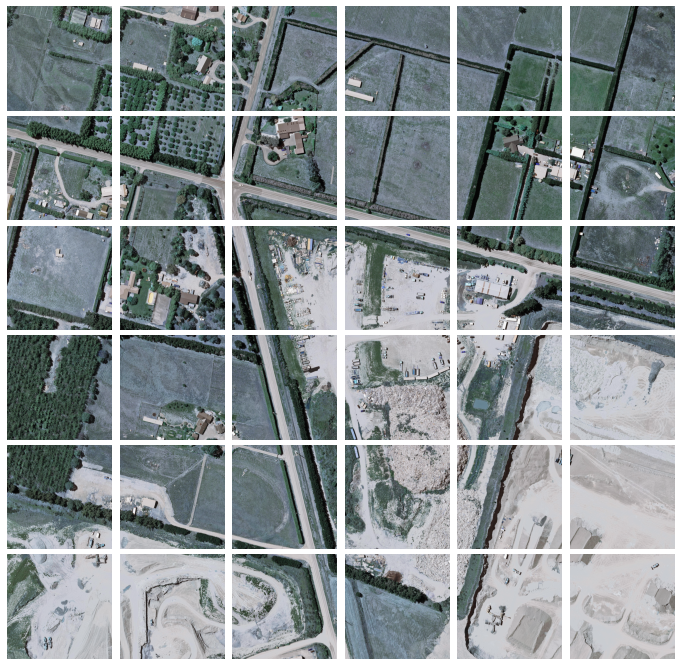

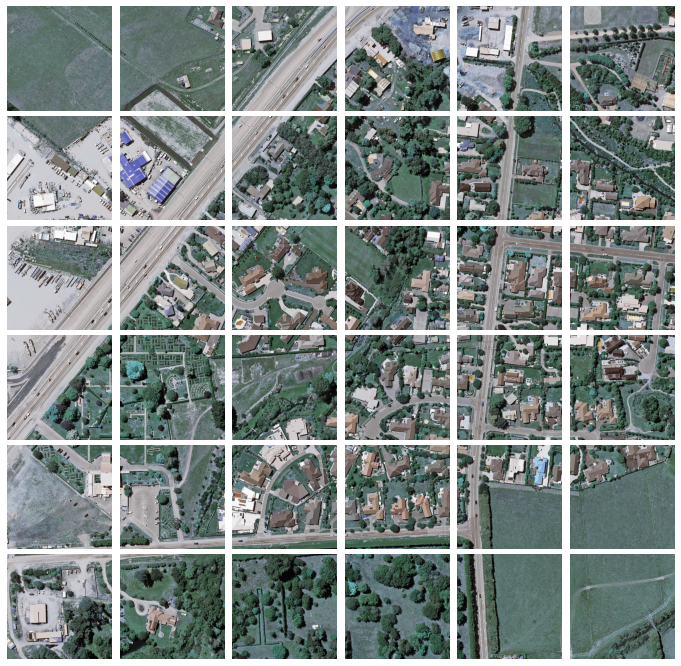

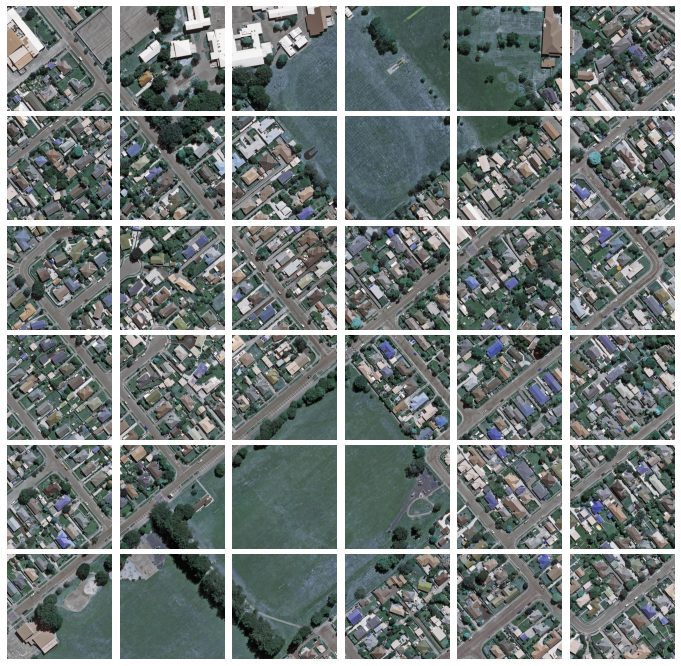

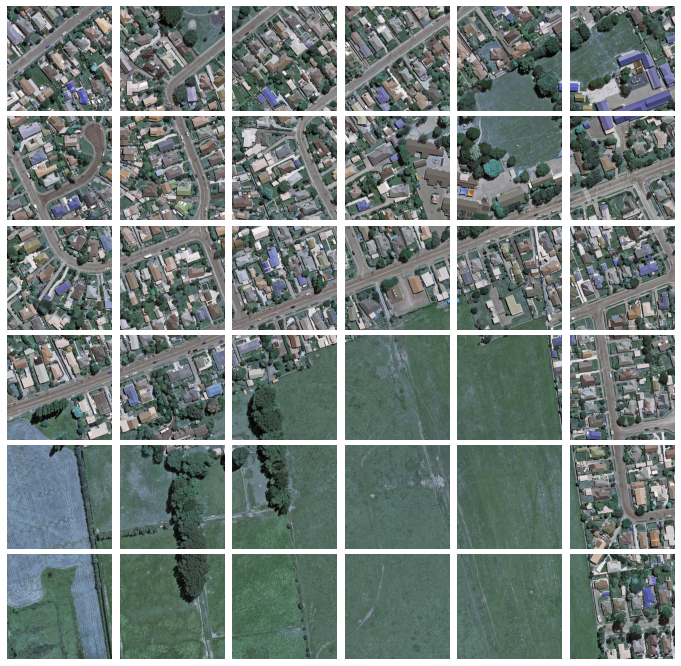

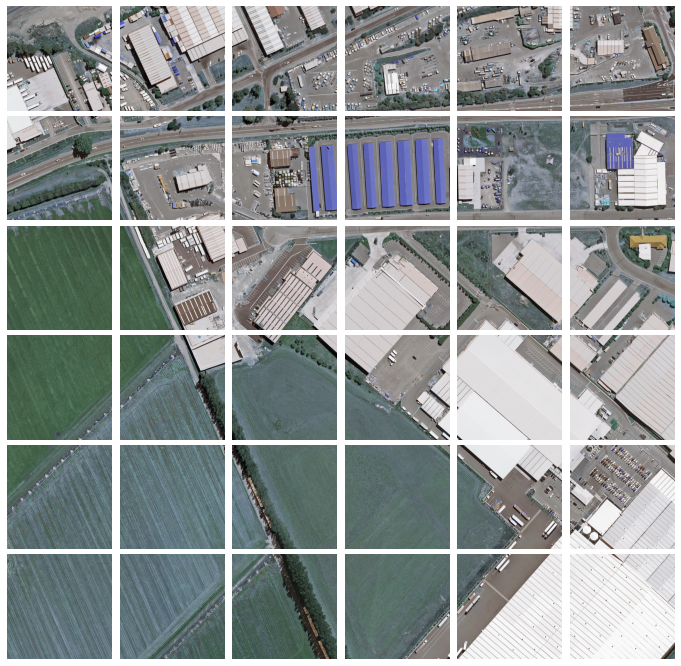

In [ ]:
for i in range(len(train_image_list)):
  # x = np.array(Image.open('/content/drive/MyDrive/airs-minisample/patch/' + train_image_list[i]))
  x = cv2.imread('/content/drive/MyDrive/airs-minisample/patch/' + train_image_list[i])
  x = np.array(x)
  x_crops = get_patches(
      img_arr=x, # required - array of images to be cropped
      size=1536, # default is 256
      stride=1536) # default is 256
  print("For {0}, x shape: {1}, x-crops shape: {2}".format(train_image_list[i], x.shape, x_crops.shape))
  filename = train_image_list[i].split('.')
  plot_patches(
    img_arr=x_crops, # required - array of cropped out images
    org_img_size=(10000, 10000), # required - original size of the image
    name = '/content/drive/MyDrive/airs-minisample/patch/train/image/'+filename[0]+'-',
    stride=1536 # use only if stride is different from patch size
    ) 
  

For christchurch_1043_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_995_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_36_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_411_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_458_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_490_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)
For christchurch_174_vis.tif, x shape: (10000, 10000, 3), x-crops shape: (36, 1536, 1536, 3)


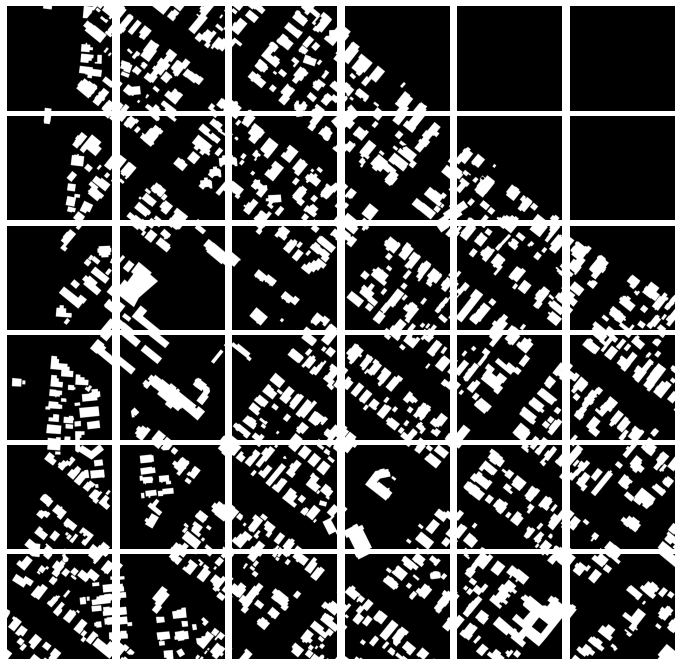

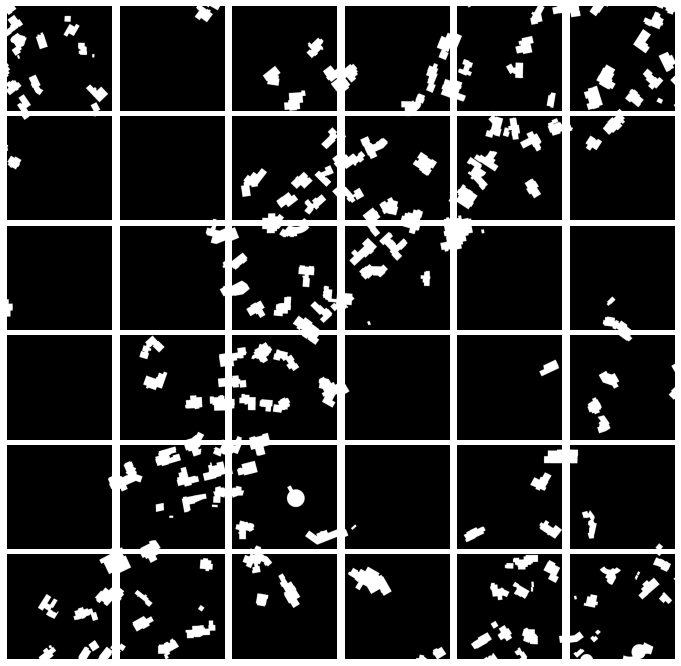

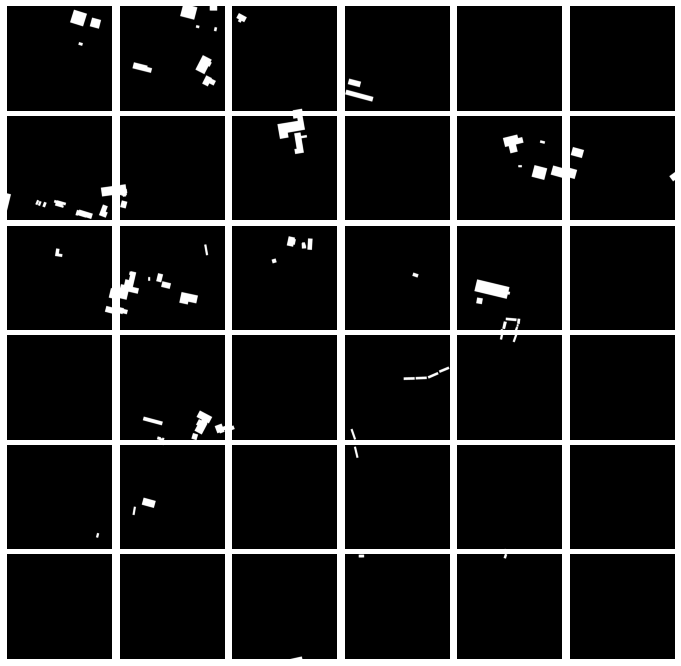

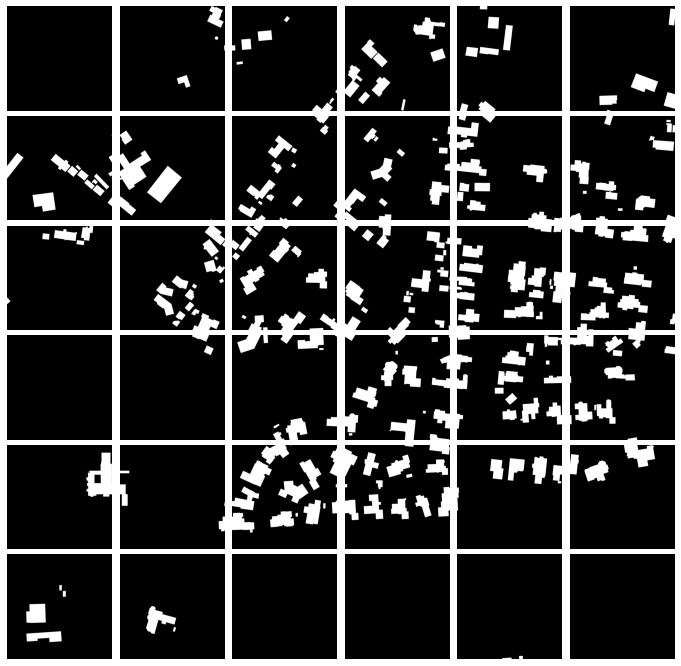

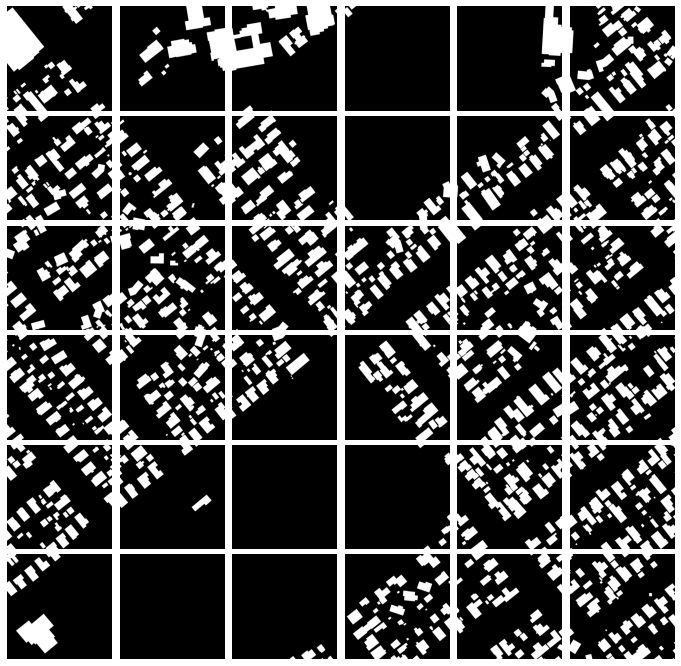

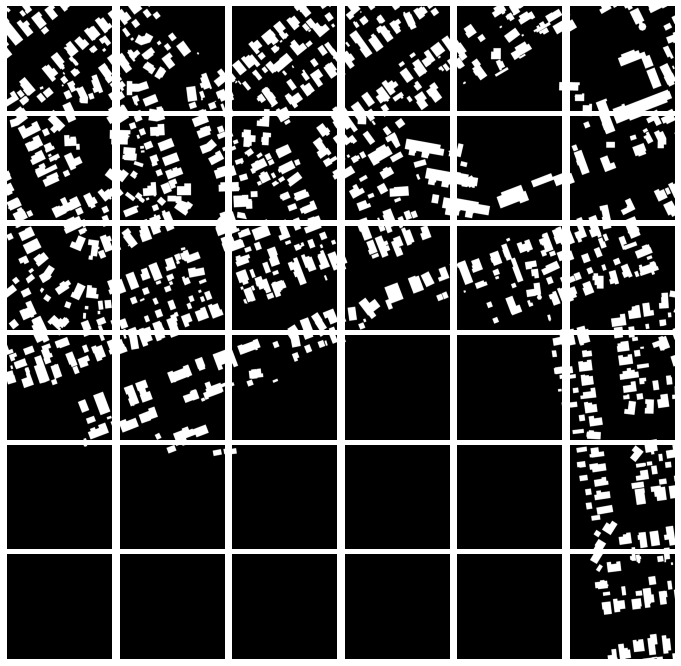

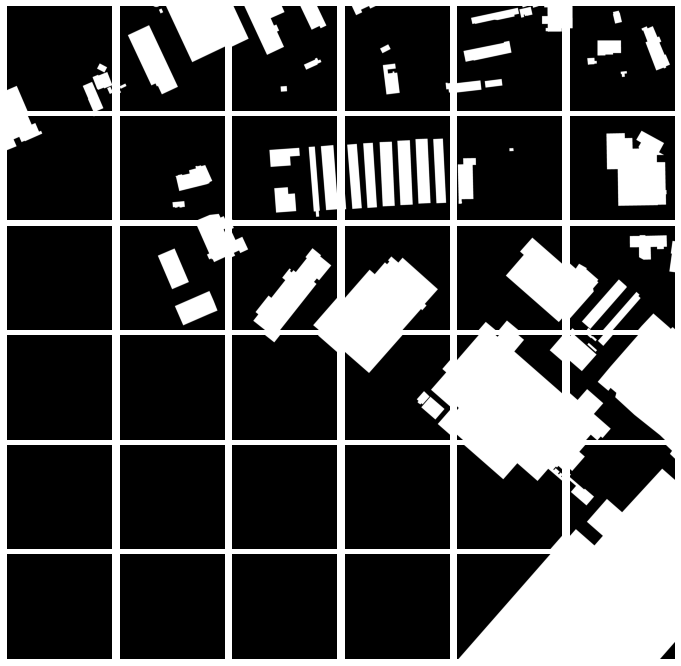

In [ ]:
for i in range(len(train_label_list)):
  # x = np.array(Image.open('/content/drive/MyDrive/airs-minisample/patch/' + train_label_list[i]))
  x = cv2.imread('/content/drive/MyDrive/airs-minisample/patch/' + train_label_list[i])
  x = np.array(x)
  x_crops = get_patches(
      img_arr=x, # required - array of images to be cropped
      size=1536, # default is 256
      stride=1536) # default is 256
  print("For {0}, x shape: {1}, x-crops shape: {2}".format(train_label_list[i], x.shape, x_crops.shape))
  filename = train_label_list[i].split('.')
  plot_patches(
    img_arr=x_crops, # required - array of cropped out images
    org_img_size=(10000, 10000), # required - original size of the image
    name = '/content/drive/MyDrive/airs-minisample/patch/train/label/'+filename[0]+'-',
    stride=1536 # use only if stride is different from patch size
    ) 
  